In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import sklearn
from sklearn.model_selection import train_test_split
from sklearn.impute import KNNImputer
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error

from tabulate import tabulate
from scipy import stats

from flaml import AutoML
from flaml.automl.data import get_output_from_log

from dython.nominal import associations
from mrmr import mrmr_regression, mrmr_classif

from scipy.stats import gaussian_kde

import statsmodels.api as sm

sklearn.set_config(transform_output="pandas")


from sklearn.cluster import KMeans, HDBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.express as px
import plotly.graph_objects as go

In [5]:
visits = pd.read_csv('Modified_Data/visits.csv')

## Preparing the data

In [6]:
id_columns = [col for col in visits.columns if '_id' in col]
print("We are dropping the following columns:", id_columns)
visits.drop(columns=id_columns, inplace=True)

We are dropping the following columns: ['visit_id', 'customer_id', 'transaction_id']


In [7]:
# drop columns 
visits.drop(columns=['start_timestamp', 'end_timestamp', 'user_first_name', 
                     'user_last_name', 'email', 'purchase_date', 'purchase_price', 
                     'release_date', 'month_year','switch_type'], inplace=True)

### Null values

In [8]:
visits.isna().sum()

visit_type                  0
visit_duration_time         0
gender                      0
email_domain             3787
platform               125546
user_review            398264
car_model              125546
fuel_type              125546
price                  125546
discount               125546
car_age_days           125546
purchased                   0
average_visit_time          0
visit_number                0
reviewed                    0
engaged                     0
loyalty                     0
dtype: int64

For now we don't care about those who didn't bought at least a car, so we are going to drop the nans (except for the email_domain)

In [ ]:
# impute the numeric values with the knn
imputer = KNNImputer(n_neighbors=10)

numeric_columns = visits.select_dtypes(include=[np.number]).columns
visits[numeric_columns] = imputer.fit_transform(visits[numeric_columns])

# save the imputed data
visits.to_csv('Modified_Data/visits_imputed.csv', index=False)

In [ ]:
visits.isna().sum()

visit_type                  0
visit_duration_time         0
gender                      0
email_domain             3787
platform               125546
user_review            398264
car_model              125546
fuel_type              125546
price                  125546
discount               125546
car_age_days           125546
purchased                   0
average_visit_time          0
visit_number                0
reviewed                    0
engaged                     0
loyalty                     0
dtype: int64

In [ ]:
# drop the nans
visits.dropna(inplace=True)
visits.shape

(40308, 17)

## Analyse the features

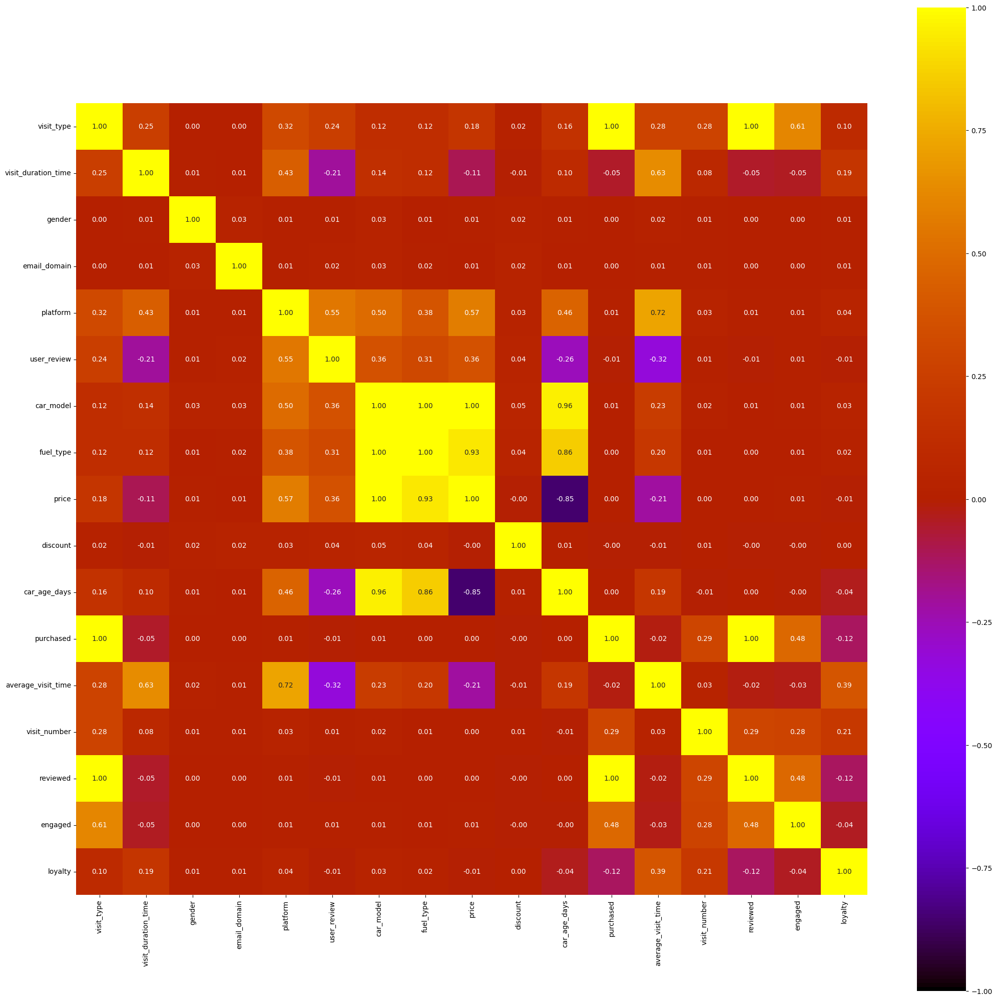

In [ ]:
associations = associations(visits, multiprocessing=True, cmap='gnuplot', num_num_assoc='spearman')

## Clustering

In [ ]:
# get dummies
visits = pd.get_dummies(visits)

In [ ]:
# normalize the data
scaler = StandardScaler()
visits = scaler.fit_transform(visits)

InvalidIndexError: (slice(None, None, None), 0)

### KMeans

In [ ]:
# KMeans
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(visits)
    sse.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), sse, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method For Optimal k')
plt.show()

NameError: name 'KMeans' is not defined

In [ ]:
# assign the clusters based on the elbow method
kmeans = KMeans(n_clusters=3)
kmeans_labels = kmeans.fit_predict(visits)

### HDBscan

In [ ]:
# HDBSCAN
min_cluster_sizes = range(5, 21)
hdbscan_labels_list = []
for min_cluster_size in min_cluster_sizes:
    hdbscan = HDBSCAN(min_cluster_size=min_cluster_size)
    labels = hdbscan.fit_predict(visits)
    hdbscan_labels_list.append(labels)

num_clusters = [len(set(labels)) - (1 if -1 in labels else 0) for labels in hdbscan_labels_list]

plt.figure(figsize=(10, 6))
plt.plot(min_cluster_sizes, num_clusters, marker='o')
plt.xlabel('Min Cluster Size')
plt.ylabel('Number of Clusters')
plt.title('HDBSCAN: Number of Clusters vs Min Cluster Size')
plt.show()

In [ ]:
# assign the labels based on the optimal min_cluster_size
hdbscan = HDBSCAN(min_cluster_size=10)
hdbscan_labels = hdbscan.fit_predict(visits)

## Results

In [ ]:
pca = PCA(n_components=3)
visits_pca = pca.fit_transform(visits)

In [ ]:
# Step 6: Plotting the Results with Plotly
def plot_3d(data, labels, title):
    if data.shape[1] != 3:
        raise ValueError("Input data must have exactly 3 columns for 3D plotting.")
    
    fig = px.scatter_3d(
        x=data[:, 0], 
        y=data[:, 1], 
        z=data[:, 2],
        color=labels.astype(str),  # Convert labels to string for better color mapping
        title=title,
        labels={"x": "PCA Component 1", "y": "PCA Component 2", "z": "PCA Component 3"}
    )
    fig.update_traces(marker=dict(size=5))
    fig.show()

# Ensure reduced_data is a NumPy array
visits_pca = np.array(visits_pca)

# Visualizing the clusters
plot_3d(visits_pca, kmeans_labels, "K-Means Clustering")
plot_3d(visits_pca, dbscan_labels, "DBSCAN Clustering")